In [95]:
import numpy as np

import matplotlib.pyplot as plt

import scipy
import scipy.signal as signal
from scipy.signal import wiener, medfilt
import scipy.io.wavfile as wav


import IPython
import IPython.display as ipd

import pandas as pd


In [96]:
plt.rcParams['figure.figsize'] = (20, 5)
plt.rcParams['axes.grid'] = True

## Load Audio

In [ ]:
audio_path = 'D:/PSD/burunghantu.wav'
samplerate, audio = wav.read(audio_path)

## FIR + AVG Filter

In [100]:
# Load audio file
audio_path = 'D:/PSD/burunghantu.wav'
samplerate, audio = wav.read(audio_path)

if audio.ndim > 1:
    audio = np.mean(audio, axis=1)

# Define FIR filter coefficients
fir_order = 20
fir_cutoff_freq = 4000  # Cutoff frequency for FIR filter

# Apply FIR filter to the audio
fir_coeff = signal.firwin(fir_order + 1, fir_cutoff_freq / (samplerate / 2))
filtered_audio_fir = signal.lfilter(fir_coeff, 1, audio)

# Apply averaging filter to the filtered audio
avg_window_size = 20
filtered_audio_avg = np.convolve(filtered_audio_fir, np.ones(avg_window_size) / avg_window_size, mode='same')

# Save the filtered audio
filtered_audio_path = 'D:/PSD/burungnoise2.wav'
wav.write(filtered_audio_path, samplerate, np.int16(filtered_audio_avg))


## Grafik Original Audio

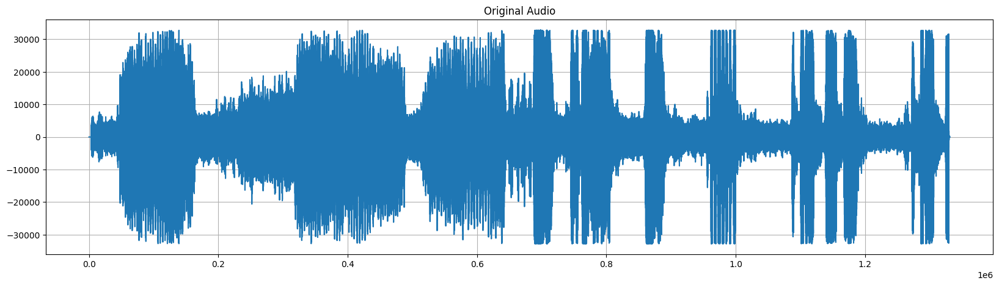

In [ ]:
# Plot the original and filtered audio waveforms
plt.plot(audio)
plt.title('Original Audio')
plt.show()

## Grafik setelah di filter dengan FIR Filter

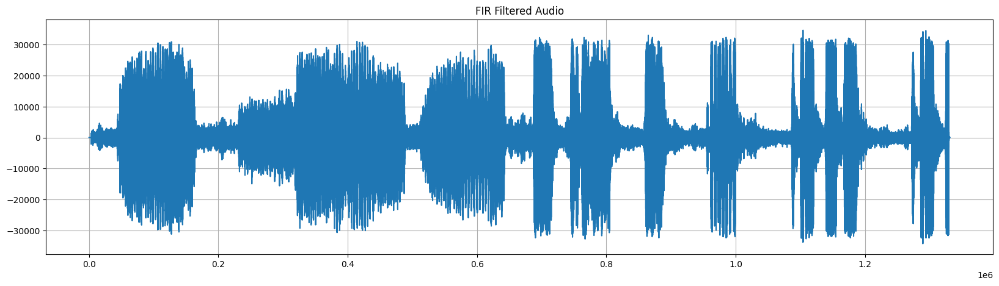

In [ ]:
plt.plot(filtered_audio_fir)
plt.title('FIR Filtered Audio')
plt.show()

## Grafik setelah di filter dengan FIR + AVG

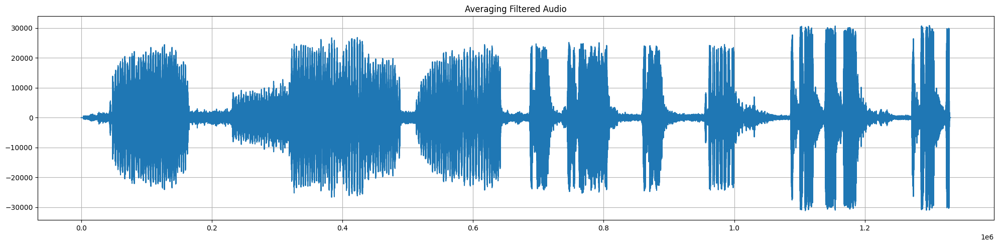

In [ ]:
plt.plot(filtered_audio_avg)
plt.title('Averaging Filtered Audio')
plt.tight_layout()
plt.show()

## Wiener Filter 

c:\Users\USER\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\signal\_signaltools.py:1629: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
c:\Users\USER\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\signal\_signaltools.py:1629: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


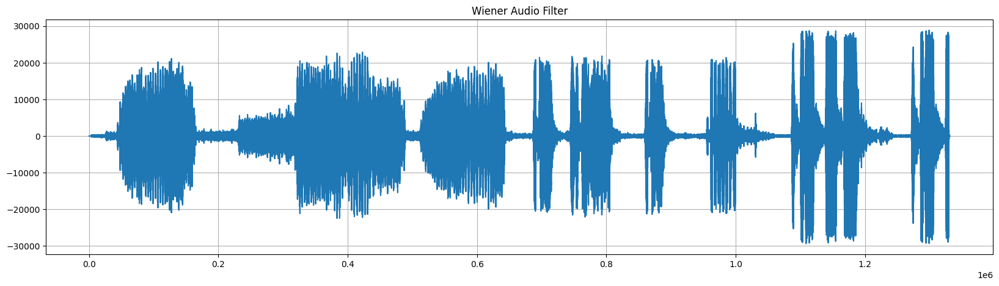

In [ ]:
# Apply Wiener Filter
filtered_audio_wiener = wiener(filtered_audio_avg, 30)
plt.plot(filtered_audio_wiener)
plt.title('Wiener Audio Filter')
plt.show()

filtered_wiener_audio_path = 'D:/PSD/burungwiener.wav'
wav.write(filtered_wiener_audio_path, samplerate,np.int16(filtered_audio_wiener))

## Audio Burung sebelum di Filter

In [ ]:
ipd.Audio('D:/PSD/burunghantu.wav')

## Audio setelah di filter dengan FIR + AVG

In [ ]:
ipd.Audio('D:/PSD/burungnoise2.wav')

## Audio setelah di filter dengan Wiener Filter

In [ ]:
ipd.Audio('D:/PSD/burungwiener.wav')